## Import Required Libraries

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Load Data

In [21]:
# Load points
points_df = pd.read_csv('points1M.csv', header=None, names=['x', 'y'])
print(f"Loaded {len(points_df)} points")

# Load labels history
labels_df = pd.read_csv('labels_history.csv', header=None)
num_iterations = labels_df.shape[1]
print(f"Number of iterations: {num_iterations}")

# Load centroids history
centroids_df = pd.read_csv('centroids_history.csv')
print(f"Loaded centroids for {centroids_df['iteration'].max() + 1} iterations")
print(f"Number of clusters (K): {len(centroids_df[centroids_df['iteration'] == 0])}")

Loaded 1000000 points
Number of iterations: 50
Loaded centroids for 50 iterations
Number of clusters (K): 3


## Preview Data

In [22]:
print("First 5 points:")
print(points_df.head())
print("\nFirst 5 rows of labels (columns are iterations):")
print(labels_df.head())
print("\nFirst 10 centroids:")
print(centroids_df.head(10))

First 5 points:
          x         y
0 -0.598952 -0.864068
1  3.650407  3.248736
2  5.367068  4.662436
3  7.215358  5.029799
4 -5.474775  4.781354

First 5 rows of labels (columns are iterations):
   0   1   2   3   4   5   6   7   8   9   ...  40  41  42  43  44  45  46  \
0   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   
1   1   1   1   1   1   1   1   1   1   1  ...   1   1   1   1   1   1   1   
2   1   1   1   1   1   1   1   1   2   2  ...   2   2   2   2   2   2   2   
3   1   1   2   2   2   2   2   2   2   2  ...   2   2   2   2   2   2   2   
4   0   0   0   0   0   0   0   0   0   0  ...   0   0   0   0   0   0   0   

   47  48  49  
0   0   0   1  
1   1   1   1  
2   2   2   2  
3   2   2   2  
4   0   0   0  

[5 rows x 50 columns]

First 10 centroids:
           x          y  iteration
0   0.000000   0.000000          0
1   5.000000   5.000000          0
2  10.000000  10.000000          0
3  -2.500888   2.499619          1
4   5.002054   5.0

## Create Animation

In [23]:
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define colors for clusters
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow']

# Get the number of clusters
K = len(centroids_df[centroids_df['iteration'] == 0])

def update(iteration):
    ax.clear()
    
    # Get labels for this iteration
    current_labels = labels_df[iteration].values
    
    # Plot points colored by their cluster assignment
    for cluster in range(K):
        cluster_points = points_df[current_labels == cluster]
        ax.scatter(cluster_points['x'], cluster_points['y'], 
                  c=colors[cluster % len(colors)], 
                  alpha=0.6, s=20, label=f'Cluster {cluster}')
    
    # Get centroids for this iteration
    current_centroids = centroids_df[centroids_df['iteration'] == iteration]
    
    # Plot centroids
    for idx, row in current_centroids.iterrows():
        cluster_idx = idx % K
        ax.scatter(row['x'], row['y'], 
                  c=colors[cluster_idx % len(colors)], 
                  marker='X', s=300, 
                  edgecolors='black', linewidths=2,
                  label=f'Centroid {cluster_idx}' if cluster_idx < K else '')
    
    ax.set_xlabel('X', fontsize=12)
    ax.set_ylabel('Y', fontsize=12)
    ax.set_title(f'K-means Clustering - Iteration {iteration}', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # Only show cluster labels in legend (not centroid duplicates)
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='best')

# Create animation
anim = FuncAnimation(fig, update, frames=num_iterations, interval=800, repeat=True)

plt.close()  # Prevent static display
HTML(anim.to_jshtml())

## Plot Static View of All Iterations

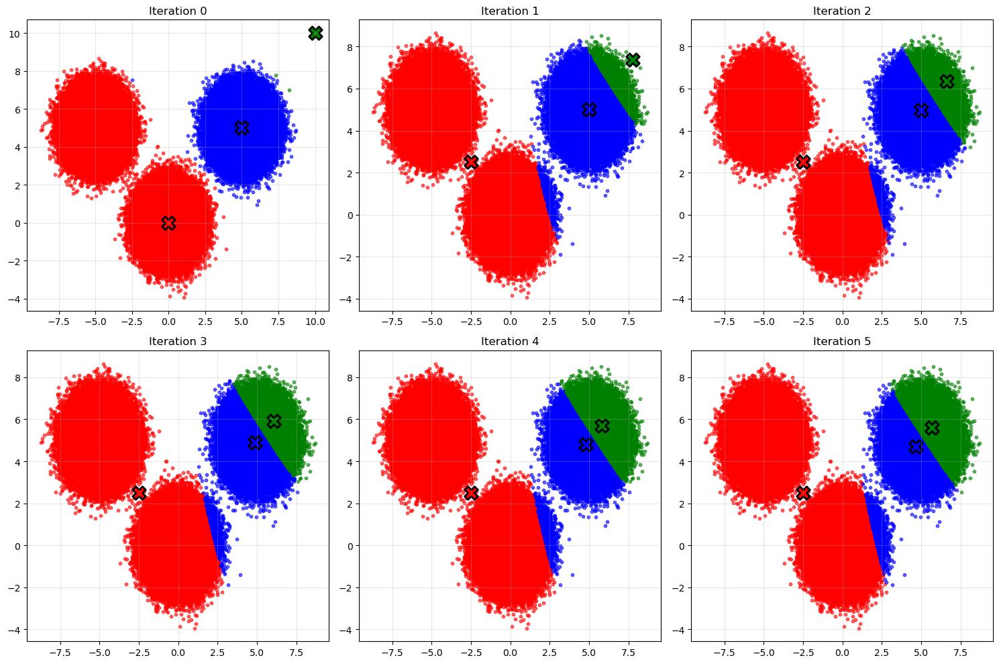

In [24]:
# Create subplots for each iteration (or first 6 if too many)
max_plots = min(6, num_iterations)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(max_plots):
    ax = axes[i]
    
    # Get labels for this iteration
    current_labels = labels_df[i].values
    
    # Plot points
    for cluster in range(K):
        cluster_points = points_df[current_labels == cluster]
        ax.scatter(cluster_points['x'], cluster_points['y'], 
                  c=colors[cluster % len(colors)], 
                  alpha=0.6, s=10)
    
    # Get centroids for this iteration
    current_centroids = centroids_df[centroids_df['iteration'] == i]
    
    # Plot centroids
    for idx, row in current_centroids.iterrows():
        cluster_idx = idx % K
        ax.scatter(row['x'], row['y'], 
                  c=colors[cluster_idx % len(colors)], 
                  marker='X', s=200, 
                  edgecolors='black', linewidths=2)
    
    ax.set_title(f'Iteration {i}')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Plot Centroid Movement

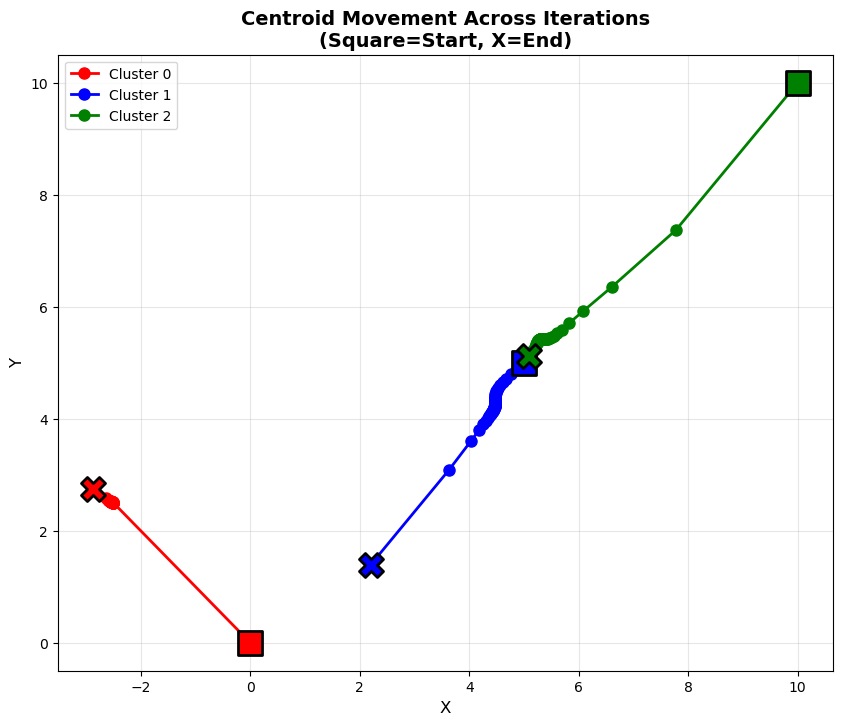

In [25]:
# Plot how centroids moved across iterations
fig, ax = plt.subplots(figsize=(10, 8))

for cluster in range(K):
    cluster_centroids = centroids_df[centroids_df.index % K == cluster]
    ax.plot(cluster_centroids['x'], cluster_centroids['y'], 
            'o-', color=colors[cluster % len(colors)], 
            linewidth=2, markersize=8, label=f'Cluster {cluster}')
    
    # Mark start and end
    ax.scatter(cluster_centroids.iloc[0]['x'], cluster_centroids.iloc[0]['y'], 
              s=300, marker='s', color=colors[cluster % len(colors)], 
              edgecolors='black', linewidths=2, zorder=5)
    ax.scatter(cluster_centroids.iloc[-1]['x'], cluster_centroids.iloc[-1]['y'], 
              s=300, marker='X', color=colors[cluster % len(colors)], 
              edgecolors='black', linewidths=2, zorder=5)

ax.set_xlabel('X', fontsize=12)
ax.set_ylabel('Y', fontsize=12)
ax.set_title('Centroid Movement Across Iterations\n(Square=Start, X=End)', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.show()

## Save Animation as GIF

In [26]:
# Create animation and save as GIF
fig, ax = plt.subplots(figsize=(10, 8))

def update(iteration):
    ax.clear()
    
    # Get labels for this iteration
    current_labels = labels_df[iteration].values
    
    # Plot points colored by their cluster assignment
    for cluster in range(K):
        cluster_points = points_df[current_labels == cluster]
        ax.scatter(cluster_points['x'], cluster_points['y'], 
                  c=colors[cluster % len(colors)], 
                  alpha=0.6, s=20, label=f'Cluster {cluster}')
    
    # Get centroids for this iteration
    current_centroids = centroids_df[centroids_df['iteration'] == iteration]
    
    # Plot centroids
    for idx, row in current_centroids.iterrows():
        cluster_idx = idx % K
        ax.scatter(row['x'], row['y'], 
                  c=colors[cluster_idx % len(colors)], 
                  marker='X', s=300, 
                  edgecolors='black', linewidths=2)
    
    ax.set_xlabel('X', fontsize=12)
    ax.set_ylabel('Y', fontsize=12)
    ax.set_title(f'K-means Clustering - Iteration {iteration}', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # Only show cluster labels in legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='best')

# Create animation
anim = FuncAnimation(fig, update, frames=num_iterations, interval=800, repeat=True)

# Save as GIF
print("Saving animation as GIF...")
anim.save('kmeans_animation.gif', writer='pillow', fps=5, dpi=100)
print("Animation saved as 'kmeans_animation.gif'")

plt.close()

Saving animation as GIF...
Animation saved as 'kmeans_animation.gif'
